## Creating Custom Dataset

In [1]:
!pip install kaggle


In [3]:
!kaggle datasets download -d tanlikesmath/the-oxfordiiit-pet-dataset


Dataset URL: https://www.kaggle.com/datasets/tanlikesmath/the-oxfordiiit-pet-dataset
License(s): CC-BY-SA-4.0
 99% 1.46G/1.48G [00:17<00:00, 94.5MB/s]
100% 1.48G/1.48G [00:17<00:00, 88.5MB/s]


In [4]:
!unzip the-oxfordiiit-pet-dataset.zip


Streaming output truncated to the last 5000 lines.
  inflating: images/images/leonberger_81.jpg  
  inflating: images/images/leonberger_82.jpg  
  inflating: images/images/leonberger_83.jpg  
  inflating: images/images/leonberger_84.jpg  
  inflating: images/images/leonberger_85.jpg  
  inflating: images/images/leonberger_86.jpg  
  inflating: images/images/leonberger_87.jpg  
  inflating: images/images/leonberger_88.jpg  
  inflating: images/images/leonberger_89.jpg  
  inflating: images/images/leonberger_9.jpg  
  inflating: images/images/leonberger_90.jpg  
  inflating: images/images/leonberger_91.jpg  
  inflating: images/images/leonberger_92.jpg  
  inflating: images/images/leonberger_93.jpg  
  inflating: images/images/leonberger_94.jpg  
  inflating: images/images/leonberger_95.jpg  
  inflating: images/images/leonberger_96.jpg  
  inflating: images/images/leonberger_97.jpg  
  inflating: images/images/leonberger_98.jpg  
  inflating: images/images/leonberger_99.jpg  
  inflatin

In [5]:
import os

# Define the main data directory
data_dir = "images"
print(data_dir)

images


## Creating class folders

In [6]:
import os
import shutil
from pathlib import Path


data_dir = "images"


output_dir = "categorized_images"
os.makedirs(output_dir, exist_ok=True)

# Get the list of all image files in the main directory
image_files = [f for f in os.listdir(data_dir) if f.endswith(('.jpg', '.jpeg', '.png', '.mat'))]

# Loop through each image file and creating classfolder
for image_file in image_files:

    class_label = image_file.split('_')[0]

    class_dir = os.path.join(output_dir, class_label)
    os.makedirs(class_dir, exist_ok=True)

    # Move the image to the corresponding class folder
    source = os.path.join(data_dir, image_file)
    destination = os.path.join(class_dir, image_file)
    shutil.move(source, destination)

print("Images have been organized by class labels!")


Images have been organized by class labels!


Category: Abyssinian, Image Count: 203


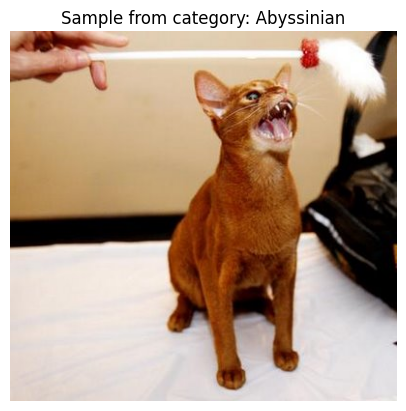

Category: Ragdoll, Image Count: 200


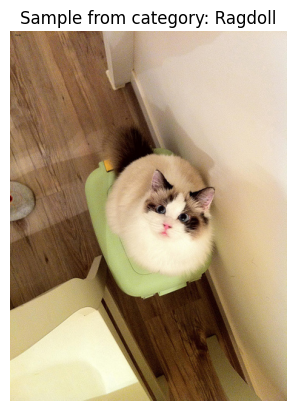

Category: chihuahua, Image Count: 200


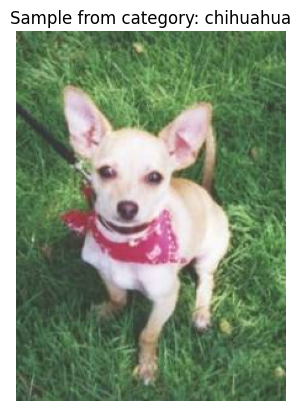

Category: great, Image Count: 200


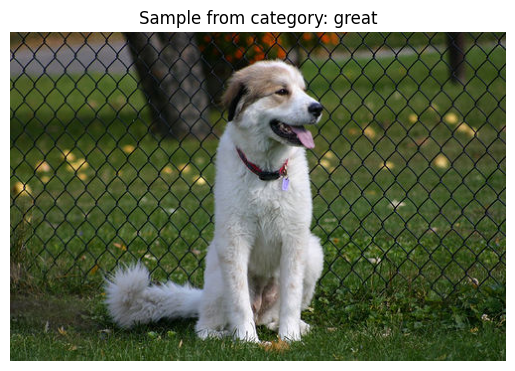

Category: miniature, Image Count: 200


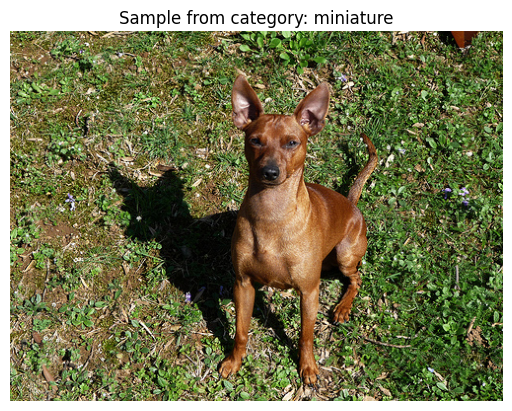

Category: basset, Image Count: 200


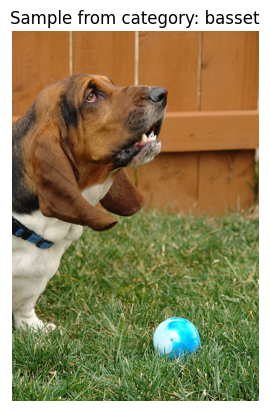

Category: pug, Image Count: 200


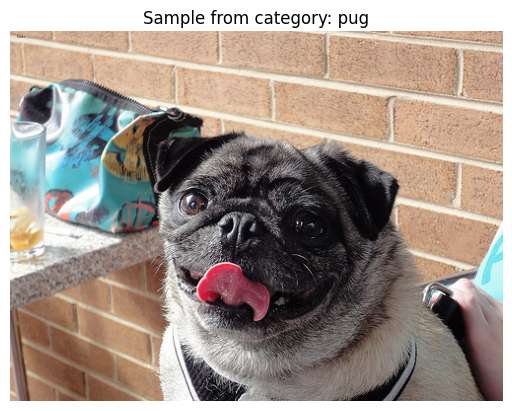

Category: scottish, Image Count: 199


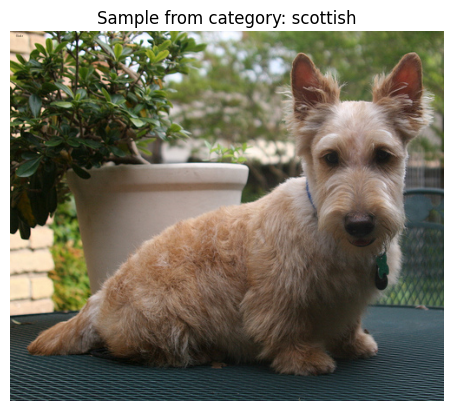

Category: yorkshire, Image Count: 200


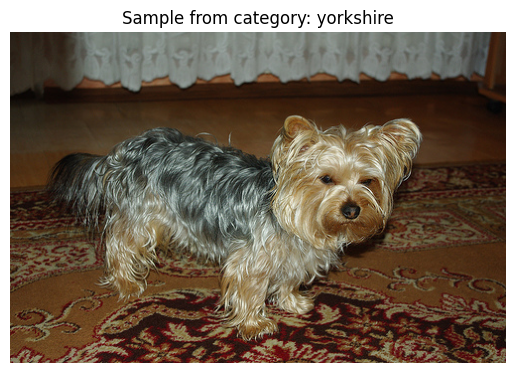

Category: beagle, Image Count: 200


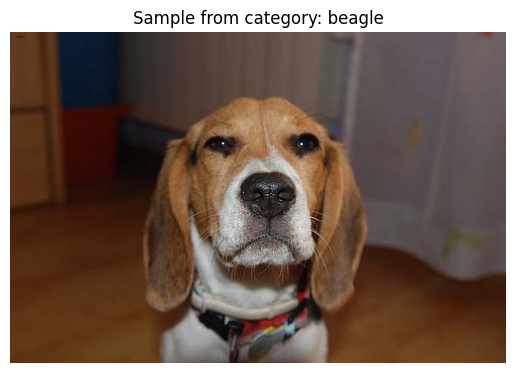

Category: shiba, Image Count: 200


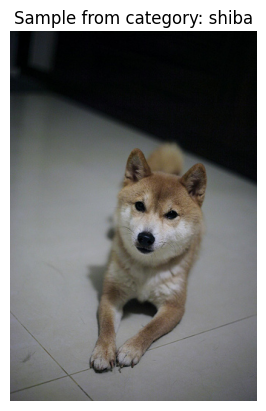

Category: samoyed, Image Count: 200


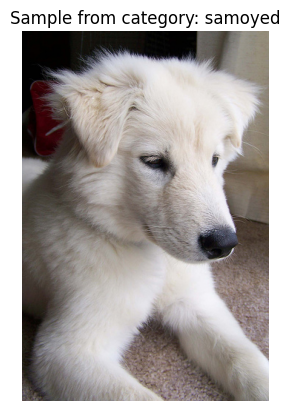

Category: Bengal, Image Count: 200


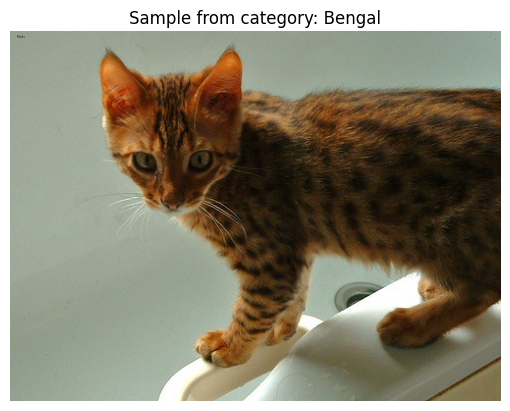

Category: havanese, Image Count: 200


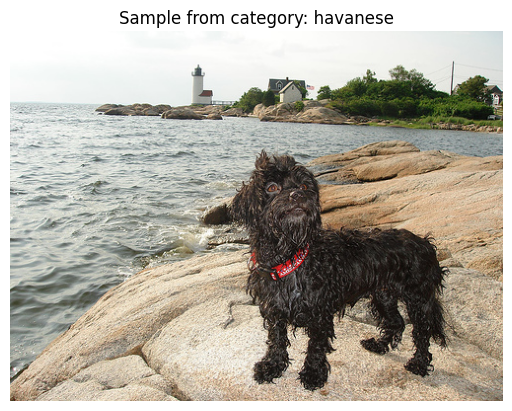

Category: Maine, Image Count: 200


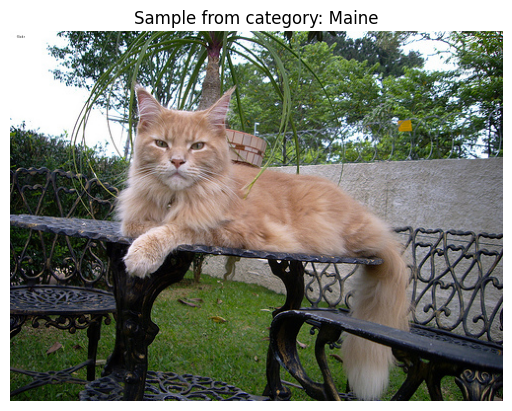

Category: Persian, Image Count: 200


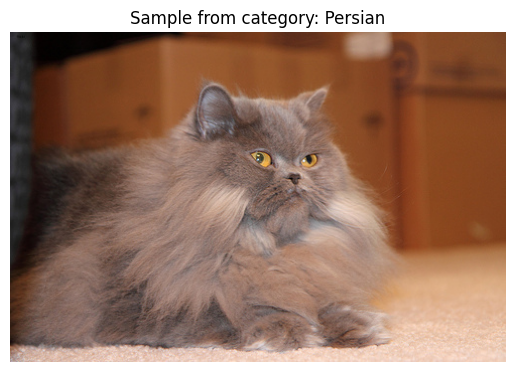

Category: Egyptian, Image Count: 200


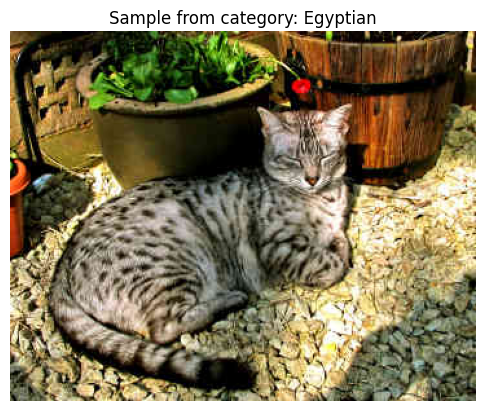

Category: boxer, Image Count: 200


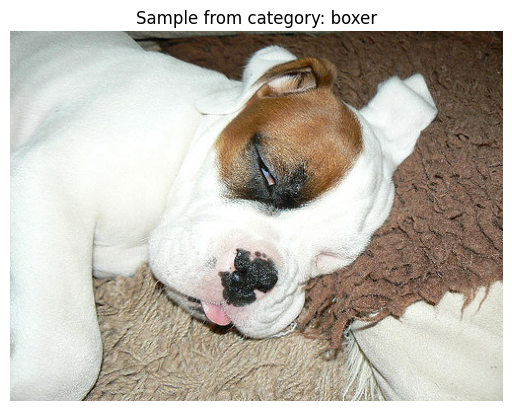

Category: american, Image Count: 400


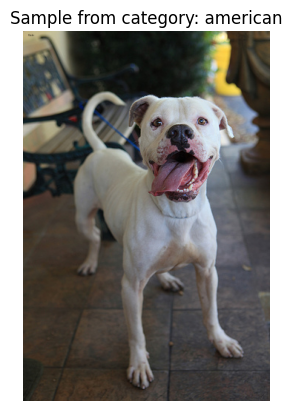

Category: wheaten, Image Count: 200


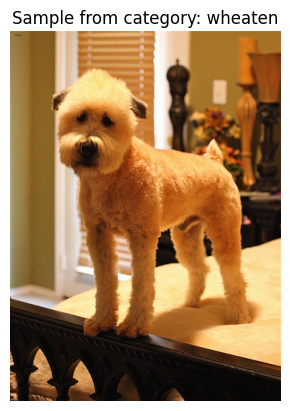

Category: Russian, Image Count: 200


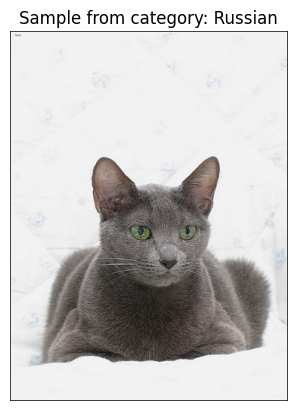

Category: British, Image Count: 200


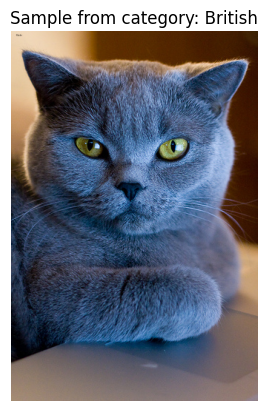

Category: Siamese, Image Count: 200


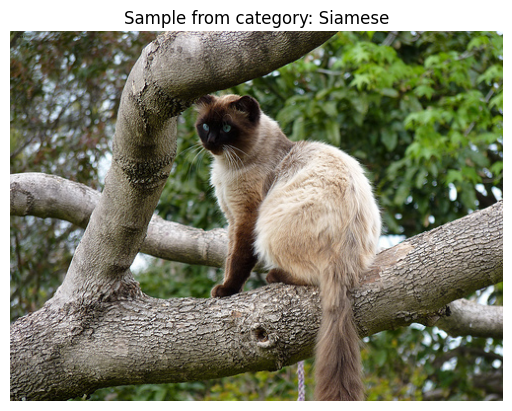

Category: staffordshire, Image Count: 191


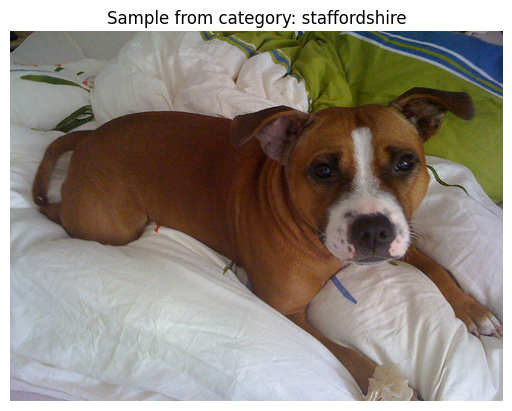

Category: english, Image Count: 400


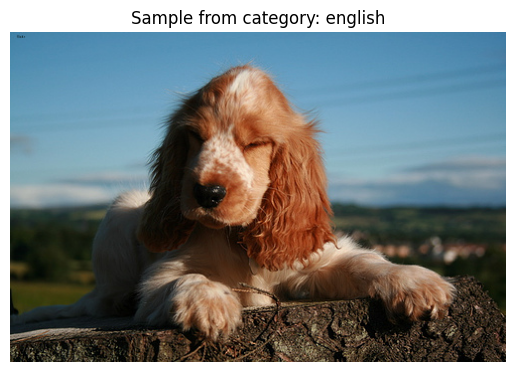

Category: Sphynx, Image Count: 200


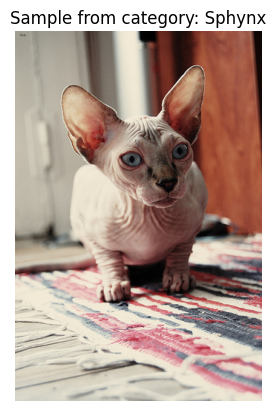

Category: keeshond, Image Count: 200


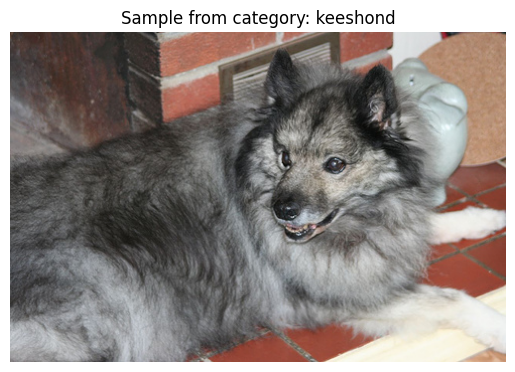

Category: leonberger, Image Count: 200


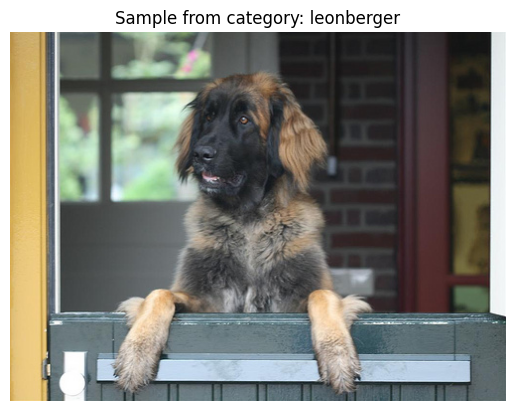

Category: saint, Image Count: 200


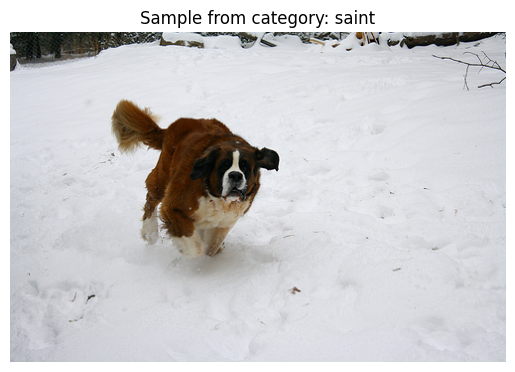

Category: Bombay, Image Count: 200


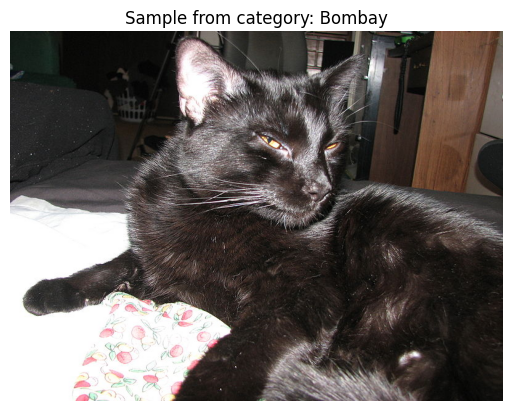

Category: german, Image Count: 200


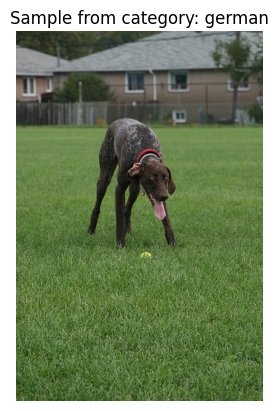

Category: Birman, Image Count: 200


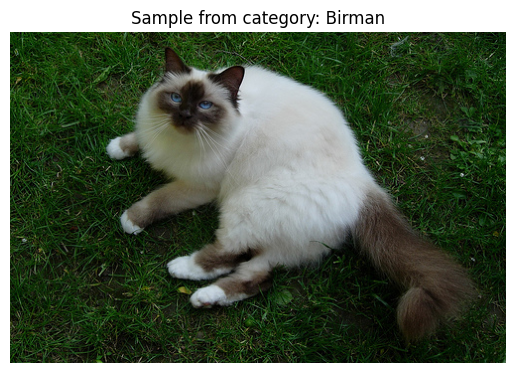

Category: newfoundland, Image Count: 200


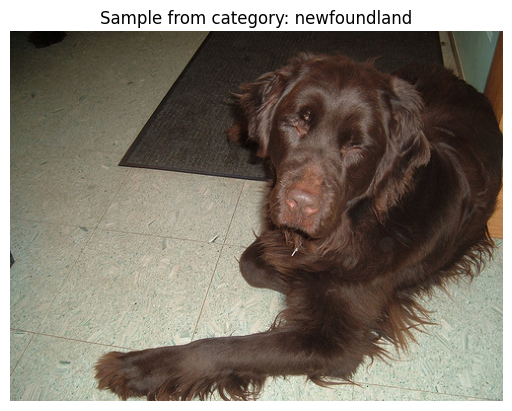

Category: pomeranian, Image Count: 200


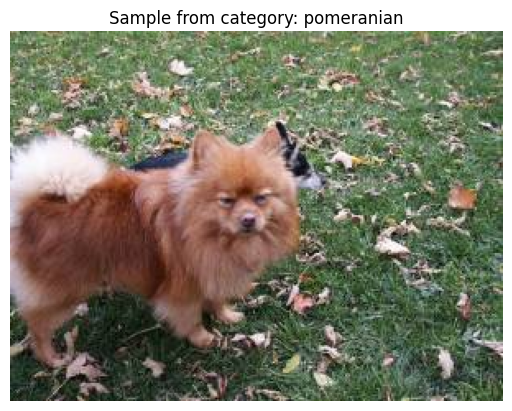

Category: japanese, Image Count: 200


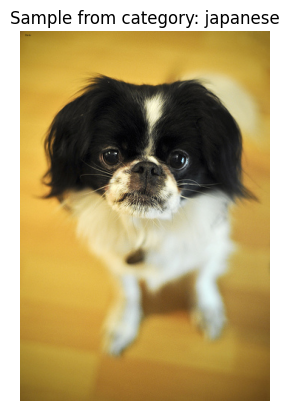


Image counts per category:
Abyssinian: 203 images
Ragdoll: 200 images
chihuahua: 200 images
great: 200 images
miniature: 200 images
basset: 200 images
pug: 200 images
scottish: 199 images
yorkshire: 200 images
beagle: 200 images
shiba: 200 images
samoyed: 200 images
Bengal: 200 images
havanese: 200 images
Maine: 200 images
Persian: 200 images
Egyptian: 200 images
boxer: 200 images
american: 400 images
wheaten: 200 images
Russian: 200 images
British: 200 images
Siamese: 200 images
staffordshire: 191 images
english: 400 images
Sphynx: 200 images
keeshond: 200 images
leonberger: 200 images
saint: 200 images
Bombay: 200 images
german: 200 images
Birman: 200 images
newfoundland: 200 images
pomeranian: 200 images
japanese: 200 images


In [7]:

from PIL import Image
import matplotlib.pyplot as plt

# Define the directory where the categorized images are stored
categorized_dir = "categorized_images"

# Dictionary to hold the image count per category
category_image_counts = {}

# Loop through each category folder
for category in os.listdir(categorized_dir):
    category_path = os.path.join(categorized_dir, category)

    if os.path.isdir(category_path):
        # Get the list of all image files in this category
        image_files = [f for f in os.listdir(category_path) if f.endswith(('.jpg', '.jpeg', '.png', '.mat'))]

        # Count the images in this category
        category_image_counts[category] = len(image_files)

        # Print the image count for the category
        print(f"Category: {category}, Image Count: {len(image_files)}")

        # Display one image from the category
        if image_files:
            image_path = os.path.join(category_path, image_files[0])  # Take the first image
            img = Image.open(image_path)

            # Show the image using matplotlib
            plt.figure()
            plt.imshow(img)
            plt.title(f"Sample from category: {category}")
            plt.axis('off')  # Hide the axis
            plt.show()

# Print total image counts for each category
print("\nImage counts per category:")
for category, count in category_image_counts.items():
    print(f"{category}: {count} images")


## Since the dataset contains multiple categories, keeping only 3 cat species and deleting the rest

Total Images Before Deleting

In [8]:
import os

# Directory where the categorized images are stored
categorized_dir = "categorized_images"

# Initialize variables
total_images = 0


# Loop through each category in the directory
for category in os.listdir(categorized_dir):
    category_path = os.path.join(categorized_dir, category)

    # Check if the category is a directory
    if os.path.isdir(category_path):
        # Get the list of all image files in this category
        image_files = [f for f in os.listdir(category_path) if f.endswith(('.jpg', '.jpeg', '.png', '.mat'))]


        # Add the image count to the total
        total_images += len(image_files)

# Print the total number of images
print(f"Total images in the dataset: {total_images}")




Total images in the dataset: 7393


Deleting Other Categories and keeping 3 Cat Categories "Abyssinian", "Persian", "Siamese"

In [9]:
import os
import shutil


categorized_dir = "categorized_images"


categories_to_keep = ["Abyssinian", "Persian", "Siamese"]


for category in os.listdir(categorized_dir):
    category_path = os.path.join(categorized_dir, category)


    if os.path.isdir(category_path) and category not in categories_to_keep:

        shutil.rmtree(category_path)
        print(f"Deleted category: {category}")

print("Dataset trimmed. Only the selected categories have been kept.")


Deleted category: Ragdoll
Deleted category: chihuahua
Deleted category: great
Deleted category: miniature
Deleted category: basset
Deleted category: pug
Deleted category: scottish
Deleted category: yorkshire
Deleted category: beagle
Deleted category: shiba
Deleted category: samoyed
Deleted category: Bengal
Deleted category: havanese
Deleted category: Maine
Deleted category: Egyptian
Deleted category: boxer
Deleted category: american
Deleted category: wheaten
Deleted category: Russian
Deleted category: British
Deleted category: staffordshire
Deleted category: english
Deleted category: Sphynx
Deleted category: keeshond
Deleted category: leonberger
Deleted category: saint
Deleted category: Bombay
Deleted category: german
Deleted category: Birman
Deleted category: newfoundland
Deleted category: pomeranian
Deleted category: japanese
Dataset trimmed. Only the selected categories have been kept.


In [10]:
import os


# Initialize variables
total_images = 0
category_image_counts = {}

# Loop through each category in the directory
for category in os.listdir(categorized_dir):
    category_path = os.path.join(categorized_dir, category)

    # Check if the category is a directory
    if os.path.isdir(category_path):
        # Get the list of all image files in this category
        image_files = [f for f in os.listdir(category_path) if f.endswith(('.jpg', '.jpeg', '.png', '.mat'))]

        # Count the images for this category
        category_image_counts[category] = len(image_files)

        # Add the image count to the total
        total_images += len(image_files)

# Print the total number of images
print(f"Total images in the dataset: {total_images}")

# Print the number of images for each category
print("\nImage counts per category:")
for category, count in category_image_counts.items():
    print(f"{category}: {count} images")


Total images in the dataset: 603

Image counts per category:
Abyssinian: 203 images
Persian: 200 images
Siamese: 200 images


In [30]:
import shutil
from google.colab import files

# Path to your trimmed dataset
categorized_dir = "categorized_images"

# Zip the directory
shutil.make_archive("trimmed_dataset", 'zip', categorized_dir)

# Download the zip file
files.download("trimmed_dataset.zip")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Data Resizing

In [11]:
batch_size = 32

In [12]:
from torchvision import datasets, transforms

# 1. Load the dataset
data_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]) #Rescale
])

## Splitting Data in Training and Testing

In [13]:
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, random_split

dataset = ImageFolder(categorized_dir, transform = data_transform)
train_size = int(0.8 * len(dataset))  # Calculate 80% of dataset size
test_size = len(dataset) - train_size  # Calculate 20% of dataset size
train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

In [14]:
class_names = dataset.classes
print(class_names)

['Abyssinian', 'Persian', 'Siamese']


In [15]:
print(len(train_dataset))

480


In [16]:
print(len(test_dataset))

120


In [17]:
train_dataloader = DataLoader(train_dataset, batch_size=32)
test_dataloader = DataLoader(test_dataset, batch_size=32)

## Data Visualization and Preprocessing

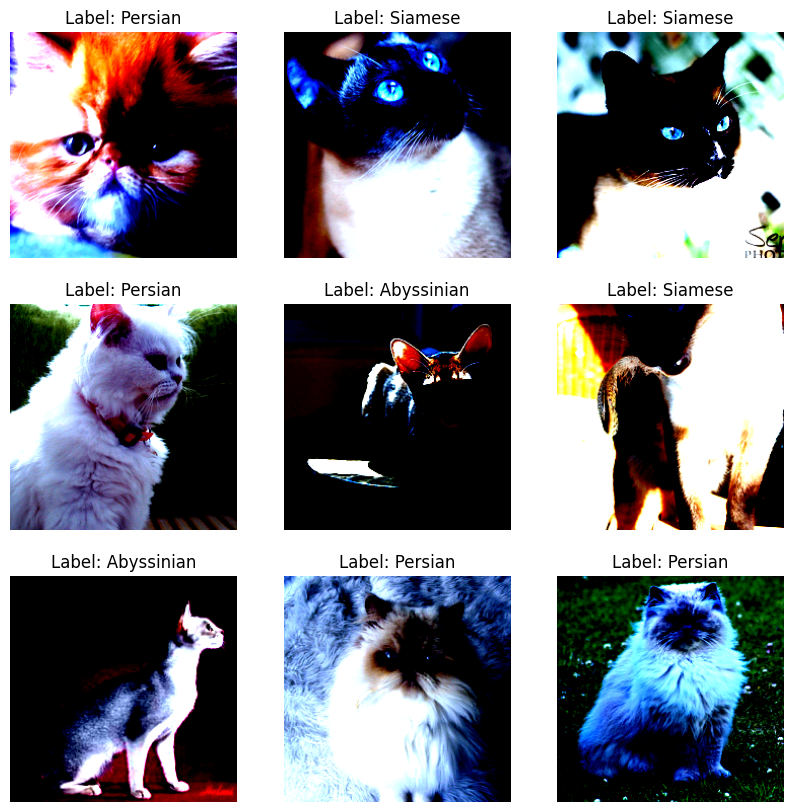

In [18]:
import torch
import torchvision
import matplotlib.pyplot as plt


data_iter = iter(train_dataloader)

# Fetch the first batch of data
images, labels = next(data_iter)

# Plot the first 9 images
plt.figure(figsize=(10, 10))
for i in range(9):
    image = images[i].permute(1, 2, 0).numpy()  # Convert tensor to numpy array
    plt.subplot(3, 3, i + 1)
    plt.imshow(image)
    plt.title(f"Label: {class_names[labels[i].item()]}")
    plt.axis("off")

plt.show()


In [19]:
for image_batch, labels_batch in train_dataloader:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

torch.Size([32, 3, 224, 224])
torch.Size([32])


In [20]:
print(len(train_dataloader.dataset))
print(train_dataloader.dataset[0][0].shape)
print(train_dataloader.dataset[1][0].shape)

480
torch.Size([3, 224, 224])
torch.Size([3, 224, 224])


In [21]:
print(images.shape)
print(labels.shape)

torch.Size([32, 3, 224, 224])
torch.Size([32])


## Building Model

In [22]:
import torch
import torch.nn as nn

class CustomModel(nn.Module):
    def __init__(self, num_classes):
        super(CustomModel, self).__init__()
        self.rescale = nn.Sequential(
            nn.Conv2d(3, 3, kernel_size=1),  # Rescaling layer, 1x1 conv
            nn.BatchNorm2d(3),  # Batch normalization to maintain scale
            nn.ReLU(inplace=True)
        )
        self.conv1 = nn.Conv2d(3, 16, kernel_size=3)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv3 = nn.Conv2d(32, 64, kernel_size=3)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(224 * 224 * 32, 128)
        self.fc2 = nn.Linear(128, num_classes)

    def forward(self, x):
        x = self.rescale(x)
        x = self.conv1(x)
        x = nn.ReLU(inplace=True)(x)
        x = self.pool1(x)
        x = self.conv2(x)
        x = nn.ReLU(inplace=True)(x)
        x = self.pool2(x)
        x = self.conv3(x)
        x = nn.ReLU(inplace=True)(x)
        x = self.pool3(x)
        x = self.flatten(x)
        x = self.fc1(x)
        x = nn.ReLU(inplace=True)(x)
        x = self.fc2(x)
        return x

# Instantiate the model
num_classes = 3
model = CustomModel(num_classes)

# Print the model architecture
print(model)


CustomModel(
  (rescale): Sequential(
    (0): Conv2d(3, 3, kernel_size=(1, 1), stride=(1, 1))
    (1): BatchNorm2d(3, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1))
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1))
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1))
  (pool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (fc1): Linear(in_features=1605632, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=3, bias=True)
)


##Create a Convolutional Neural Network model to learn about training set

In [23]:
import torch
import torch.nn as nn

class CNNModel(nn.Module):
    def __init__(self, num_classes, img_height, img_width):
        super(CNNModel, self).__init__()
        self.rescaling = nn.Sequential(
            nn.Conv2d(3, 3, kernel_size=1),
            nn.BatchNorm2d(3),
            nn.ReLU(inplace=True)
        )
        self.conv1 = nn.Conv2d(3, 16, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(64 * (img_height // 8) * (img_width // 8), 128)
        self.fc2 = nn.Linear(128, num_classes)

    def forward(self, x):
        x = self.rescaling(x)
        x = self.pool(nn.functional.relu(self.conv1(x)))
        x = self.pool(nn.functional.relu(self.conv2(x)))
        x = self.pool(nn.functional.relu(self.conv3(x)))
        x = self.flatten(x)
        x = nn.functional.relu(self.fc1(x))
        x = self.fc2(x)
        return x

# Define input dimensions
img_height, img_width = 224, 224
# Define the number of classes
num_classes = 3

# Instantiate the model
model = CNNModel(num_classes, img_height, img_width)


In [24]:
import torch.optim as optim
import torch.nn.functional as F

# Define the optimizer
optimizer = optim.Adam(model.parameters())

# Define the loss function
criterion = nn.CrossEntropyLoss()

# Define the metrics (accuracy)
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

# Define the training loop
def train_model(model, train_dl, criterion, optimizer, num_epochs=10):
    for epoch in range(num_epochs):
        model.train()  # Set the model to train mode
        train_loss = 0.0
        train_acc = 0.0

        for images, labels in train_dl:
            optimizer.zero_grad()  # Zero the parameter gradients
            outputs = model(images)  # Forward pass
            loss = criterion(outputs, labels)  # Calculate the loss
            loss.backward()  # Backward pass
            optimizer.step()  # Optimize

            # Compute training accuracy
            acc = accuracy(outputs, labels)
            train_acc += acc.item() * images.size(0)

            # Track training loss
            train_loss += loss.item() * images.size(0)

        # Print training statistics
        epoch_loss = train_loss / len(train_dl.dataset)
        epoch_acc = train_acc / len(train_dl.dataset)
        print(f"Epoch {epoch + 1}/{num_epochs}, Loss: {epoch_loss:.4f}, Accuracy: {epoch_acc:.4f}")

# Train the model
num_epochs = 5  # Choose the number of epochs
train_model(model, train_dataloader, criterion, optimizer, num_epochs)

Epoch 1/5, Loss: 1.0824, Accuracy: 0.4250
Epoch 2/5, Loss: 0.9218, Accuracy: 0.6104
Epoch 3/5, Loss: 0.7905, Accuracy: 0.6604
Epoch 4/5, Loss: 0.6324, Accuracy: 0.7104
Epoch 5/5, Loss: 0.5158, Accuracy: 0.7896


## Now adding Data Augmentation Layers to flip the image and avoid overfitting

In [25]:
import torch.optim as optim
import torch.nn.functional as F

# Define the optimizer
optimizer = optim.Adam(model.parameters())

# Define the loss function
criterion = nn.CrossEntropyLoss()

# Define the metrics (accuracy)
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

# Define the training loop
def train_model(model, train_dl, criterion, optimizer, num_epochs=10):
    for epoch in range(num_epochs):
        model.train()  # Set the model to train mode
        train_loss = 0.0
        train_acc = 0.0

        for images, labels in train_dl:
            data_augmented_inputs = torch.stack([transforms.RandomHorizontalFlip()(img) for img in images])
            data_augmented_inputs = torch.stack([transforms.RandomRotation(degrees=10)(img) for img in data_augmented_inputs])
            optimizer.zero_grad()  # Zero the parameter gradients
            outputs = model(images)  # Forward pass
            loss = criterion(outputs, labels)  # Calculate the loss
            loss.backward()  # Backward pass
            optimizer.step()  # Optimize

            # Compute training accuracy
            acc = accuracy(outputs, labels)
            train_acc += acc.item() * images.size(0)

            # Track training loss
            train_loss += loss.item() * images.size(0)

        # Print training statistics
        epoch_loss = train_loss / len(train_dl.dataset)
        epoch_acc = train_acc / len(train_dl.dataset)
        print(f"Epoch {epoch + 1}/{num_epochs}, Loss: {epoch_loss:.4f}, Accuracy: {epoch_acc:.4f}")

# Train the model
num_epochs = 3  # Choose the number of epochs
train_model(model, train_dataloader, criterion, optimizer, num_epochs)

Epoch 1/3, Loss: 0.4737, Accuracy: 0.8229
Epoch 2/3, Loss: 0.3082, Accuracy: 0.8896
Epoch 3/3, Loss: 0.1662, Accuracy: 0.9646


In [26]:


# Function to make predictions and compare them with actual labels
def make_predictions_and_compare(model, test_dl):
    model.eval()  # Set the model to evaluation mode
    all_preds = []
    all_labels = []

    with torch.no_grad():  # Disable gradient calculations for evaluation
        for images, labels in test_dl:
            outputs = model(images)  # Forward pass
            _, preds = torch.max(outputs, dim=1)  # Get predictions (index of max probability)
            all_preds.extend(preds.cpu().numpy())  # Store predictions as numpy array
            all_labels.extend(labels.cpu().numpy())  # Store true labels as numpy array

    return all_preds, all_labels

# Example usage after training:
predictions, true_labels = make_predictions_and_compare(model, test_dataloader)

# Now you can compare the predicted labels with the true labels
print("Predictions: ", predictions)
print("True Labels: ", true_labels)



Predictions:  [1, 2, 0, 0, 2, 1, 2, 2, 2, 1, 2, 0, 0, 2, 0, 2, 1, 0, 1, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 1, 0, 2, 2, 0, 2, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 2, 1, 0, 0, 0, 2, 1, 0, 2, 0, 0, 1, 2, 0, 1, 1, 0, 0, 2, 0, 2, 0, 2, 2, 2, 2, 0, 2, 1, 0, 2, 2, 2, 0, 2, 0, 1, 2, 2, 0, 0, 1, 0, 2, 0, 2, 2, 0, 2, 0, 0, 0, 1, 1, 2, 1, 1, 1, 2, 0, 1, 1, 2, 2, 0, 0, 1, 0, 0, 0, 0, 0, 2, 1]
True Labels:  [1, 2, 0, 2, 0, 1, 2, 1, 2, 1, 0, 2, 2, 1, 2, 2, 1, 0, 1, 1, 2, 0, 1, 1, 2, 2, 1, 2, 1, 0, 0, 2, 1, 0, 2, 0, 2, 0, 0, 0, 2, 0, 2, 2, 0, 1, 0, 0, 2, 1, 2, 2, 1, 2, 1, 0, 0, 0, 0, 1, 1, 1, 0, 2, 0, 0, 1, 0, 2, 2, 2, 2, 0, 2, 1, 0, 2, 2, 1, 0, 1, 0, 1, 2, 0, 1, 0, 1, 0, 0, 0, 2, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 2, 0, 1, 1, 0, 2, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0]


In [29]:
import pandas as pd
# Create a DataFrame to store the predictions and true labels
df = pd.DataFrame({
    'True Label': true_labels,
    'Predicted Label': predictions
})

# Save the DataFrame to a CSV file
df.to_csv('predictions_CNN.csv', index=False)

print("Predictions saved to 'predictions_CNN.csv'")

Predictions saved to 'predictions_CNN.csv'


In [27]:
def evaluate_test_accuracy(model, test_dl):
    model.eval()  # Set the model to evaluation mode
    test_acc = 0.0

    with torch.no_grad():  # Disable gradient calculations for evaluation
        for images, labels in test_dl:
            outputs = model(images)  # Forward pass

            # Compute test accuracy
            acc = accuracy(outputs, labels)
            test_acc += acc.item() * images.size(0)

    # Compute final test accuracy
    test_acc = test_acc / len(test_dl.dataset)
    print(f"Final Test Accuracy: {test_acc:.4f}")

In [28]:
evaluate_test_accuracy(model, test_dataloader)

Final Test Accuracy: 0.6333


As observed the Test accuracy is quite low as compared to the train accuracy for this model, This could be due to potential overfitiing of the model on the training dataset.
As the dataset is quite small to train a Deep Learning Model, one possible solution could be to use a bigger dataset.
To avoid overfitting several other techniques like Regularization and dropout can be applied.

Another Solution could be to use a pretrained model and Fine Tune it for our dataset.



## GoogleNet(InceptionNet) Model

In [31]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models


num_classes = 3

# Load the pre-trained GoogleNet model
googlenet_model = models.googlenet(pretrained=True)

# Modify the final fully connected layer (fc)
googlenet_model.fc = nn.Linear(googlenet_model.fc.in_features, num_classes)

# Move model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
googlenet_model = googlenet_model.to(device)

# Define optimizer and loss function for GoogleNet
googlenet_optimizer = optim.Adam(googlenet_model.parameters())
criterion = nn.CrossEntropyLoss()

# Reuse the accuracy function from your custom model
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

# Step 2: Training Loop for GoogleNet
def train_googlenet_model(model, train_dl, criterion, optimizer, num_epochs=3):
    for epoch in range(num_epochs):
        model.train()
        train_loss = 0.0
        train_acc = 0.0

        for images, labels in train_dl:
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            acc = accuracy(outputs, labels)
            train_acc += acc.item() * images.size(0)
            train_loss += loss.item() * images.size(0)

        epoch_loss = train_loss / len(train_dl.dataset)
        epoch_acc = train_acc / len(train_dl.dataset)
        print(f"GoogleNet Epoch {epoch + 1}/{num_epochs}, Loss: {epoch_loss:.4f}, Accuracy: {epoch_acc:.4f}")

# Train GoogleNet model
train_googlenet_model(googlenet_model, train_dataloader, criterion, googlenet_optimizer, num_epochs=3)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/googlenet-1378be20.pth" to /root/.cache/torch/hub/checkpoints/googlenet-1378be20.pth
100%|██████████| 49.7M/49.7M [00:02<00:00, 19.6MB/s]


GoogleNet Epoch 1/3, Loss: 0.2031, Accuracy: 0.9208
GoogleNet Epoch 2/3, Loss: 0.0563, Accuracy: 0.9854
GoogleNet Epoch 3/3, Loss: 0.0382, Accuracy: 0.9875


In [32]:
# Evaluate the GoogleNet model on the test dataset
print("GoogleNet Model Test Accuracy:")
evaluate_test_accuracy(googlenet_model, test_dataloader)

GoogleNet Model Test Accuracy:
Final Test Accuracy: 0.9000


In [33]:




# Example usage after training:
predictions, true_labels = make_predictions_and_compare(googlenet_model, test_dataloader)

# Now you can compare the predicted labels with the true labels
print("Predictions: ", predictions)
print("True Labels: ", true_labels)



Predictions:  [1, 2, 0, 2, 0, 1, 2, 1, 2, 1, 0, 2, 2, 1, 2, 2, 1, 0, 1, 1, 2, 0, 1, 1, 2, 2, 0, 2, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 1, 0, 0, 1, 1, 2, 2, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 2, 1, 2, 2, 0, 2, 1, 0, 2, 2, 1, 0, 1, 0, 1, 2, 1, 1, 0, 1, 0, 0, 0, 2, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 2, 0, 1, 1, 0, 2, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0]
True Labels:  [1, 2, 0, 2, 0, 1, 2, 1, 2, 1, 0, 2, 2, 1, 2, 2, 1, 0, 1, 1, 2, 0, 1, 1, 2, 2, 1, 2, 1, 0, 0, 2, 1, 0, 2, 0, 2, 0, 0, 0, 2, 0, 2, 2, 0, 1, 0, 0, 2, 1, 2, 2, 1, 2, 1, 0, 0, 0, 0, 1, 1, 1, 0, 2, 0, 0, 1, 0, 2, 2, 2, 2, 0, 2, 1, 0, 2, 2, 1, 0, 1, 0, 1, 2, 0, 1, 0, 1, 0, 0, 0, 2, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 2, 0, 1, 1, 0, 2, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0]


In [34]:
import pandas as pd
# Create a DataFrame to store the predictions and true labels
df = pd.DataFrame({
    'True Label': true_labels,
    'Predicted Label': predictions
})

# Save the DataFrame to a CSV file
df.to_csv('predictions_Googlenet.csv', index=False)

print("Predictions saved to 'predictions_Googlenet.csv'")

Predictions saved to 'predictions_Googlenet.csv'


In [35]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import requests
from io import BytesIO
from torch import argmax

img_height, img_width = 224, 224
# Define the URL of the image
persian_cat_url = "https://cdn.pixabay.com/photo/2017/11/09/21/41/cat-2934720_1280.jpg"


# Download the image and convert it to a PyTorch tensor
response = requests.get(persian_cat_url)
img = Image.open(BytesIO(response.content)).convert('RGB')
img = img.resize((img_width, img_height))  # Resize the image to match the model's input size
img_tensor = transforms.ToTensor()(img)
img_tensor = img_tensor.unsqueeze(0)  # Add batch dimension

# Move the tensor to the appropriate device (GPU if available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
img_tensor = img_tensor.to(device)


In [36]:
from torch import argmax

# Make predictions
googlenet_model.eval()  # Set the model to evaluation mode
with torch.no_grad():
    outputs = googlenet_model(img_tensor)
    probabilities = torch.softmax(outputs, dim=1)

# Convert tensor to numpy array
predicted_class = class_names[argmax(probabilities)]

# Print the predicted class and confidence
predicted_class = class_names[torch.argmax(probabilities)]
confidence = torch.max(probabilities).item()
print(f"This image most likely belongs to {predicted_class} with a {confidence*100:.2f}% confidence.")


This image most likely belongs to Abyssinian with a 100.00% confidence.


In [38]:
# Load and preprocess the unseen image
image_path = '/content/persian_cat.jpg'  # Replace with the path to your image
image = Image.open(image_path)
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
input_tensor = preprocess(image)
input_batch = input_tensor.unsqueeze(0)  # Add a batch dimension

In [39]:
# Perform inference
with torch.no_grad():
    output = googlenet_model(input_batch)

# Get the predicted class
_, predicted_class = output.max(1)


predicted_class_name = class_names[predicted_class.item()]
probabilities = torch.softmax(outputs, dim=1)
confidence = torch.max(probabilities).item()
print(f"This image most likely belongs to {predicted_class_name} with a {confidence*100:.2f}% confidence.")

This image most likely belongs to Abyssinian with a 100.00% confidence.


## Observations:

 CNN model achieved an accuracy of 63% on the test dataset, while the GoogleNet (InceptionNet) model achieved a much higher accuracy of 90%.

## Possible Reasons:
**Model Complexity and Depth:**
GoogleNet is a highly complex and deep model, featuring multiple inception modules and auxiliary classifiers.
The custom CNN model is relatively shallow, with only three convolutional layers, limiting its capacity to capture more complex patterns in the data.

**Pre-training on ImageNet:**
GoogleNet was pre-trained on the ImageNet dataset, which consists of millions of labeled images across a wide variety of categories. This pre-training allows the model to start with a strong foundation of learned features, making it more effective for transfer learning tasks.
The custom CNN model was trained from scratch on the current dataset, meaning it had to learn all features without any prior knowledge, which can be a disadvantage, especially with a smaller dataset.

**Regularization and Dropout:**
GoogleNet incorporates regularization techniques such as dropout and auxiliary classifiers, which help prevent overfitting and improve generalization to unseen data.
The custom CNN model does not seem to use such regularization techniques, making it more prone to overfitting and potentially less generalizable.

**Dataset Size:**
GoogleNet, due to its pre-training on ImageNet, is more robust and can perform well even on smaller datasets.
The custom CNN model might struggle with smaller datasets when trained from scratch, resulting in lower performance.

**Hyperparameters and Optimizer:**
GoogleNet is fine-tuned with well-optimized hyperparameters (such as learning rates and optimizers) that have been carefully selected for its architecture.
